
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------

##**Transfer Learning not Fine tuning** --> i remove the frezz layers

#**-Dataset:**

 YOLO , Manual Segmentation +CLassification


  206 sample train 145 valid 41 test 20


  4 classes (screws2_4 , screws5_8 , rod , plate)

loaded via code snippet --> yaml file

IMPLANT not BONE


--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------


#**-Model:**

 yolo11m- seg   ---> fine tuned earlier (https://drive.google.com/file/d/1eCQGgMZALKpWcElnUvxSCcORJ2G6jxoI/view?usp=drive_link)


epochs 150
batch 16


--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------




##runetime type:100A



--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------


In [ ]:
!pip install roboflow ultralytics -q


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.8/195.8 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 84.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 85.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 111.6 MB/s eta 0:00:00


In [ ]:
from roboflow import Roboflow
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:

rf = Roboflow(api_key="PRIVATE")
project = rf.workspace("h-tdbrs").project("binarymasks-flux-implant-agument")
version = project.version(2)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to binaryMasks-flux-implant-agument-2 in yolov11:: 100%|██████████| 417/417 [00:00<00:00, 8041.64it/s]


In [ ]:
from google.colab import drive

drive.mount("/content/drive")


Mounted at /content/drive


In [ ]:
model = YOLO("/content/drive/MyDrive/GP2 CODE & DATA/Segmentation/Implant_seg/yolo11m_seg_best.pt")


In [ ]:
dataset = project.version(2).download("yolov11")

print(dataset.location)

/content/binaryMasks-flux-implant-agument-2



--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------






#**show my Dataset  (Train , Valid , Test)**

#**just to check the mask , not the class**

--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------




Total images: 206


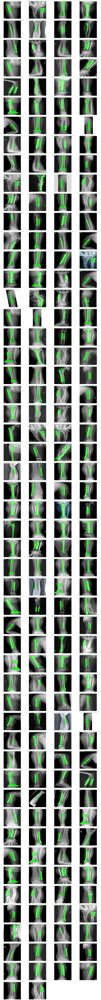

In [ ]:
import glob
import cv2
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import Image, display

image_files = glob.glob(f"{dataset.location}/train/images/*") + \
              glob.glob(f"{dataset.location}/valid/images/*") + \
              glob.glob(f"{dataset.location}/test/images/*")

print(f"Total images: {len(image_files)}")

cols = 4
rows = (len(image_files) + cols - 1) // cols
THUMB = 200

fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 3))
axes = axes.flatten()

for i, img_path in enumerate(image_files):
    label_path = img_path.replace("images", "labels").rsplit(".", 1)[0] + ".txt"

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (THUMB, THUMB))
    img = np.ascontiguousarray(img)
    h, w = img.shape[:2]

    if os.path.exists(label_path):
        with open(label_path) as f:
            for line in f.readlines():
                vals = list(map(float, line.strip().split()))
                if len(vals) > 6:
                    pts = np.array(vals[1:]).reshape(-1, 2)
                    pts[:, 0] *= w
                    pts[:, 1] *= h
                    pts = pts.astype(np.int32)
                    overlay = img.copy()
                    cv2.fillPoly(overlay, [pts], (0, 255, 0))
                    img = cv2.addWeighted(img, 0.6, overlay, 0.4, 0)
                    cv2.polylines(img, [pts], True, (0, 255, 0), 2)
        axes[i].set_title(f"OK {os.path.basename(img_path)}", fontsize=6, color="green")
    else:
        axes[i].set_title("NO LABEL", fontsize=6, color="red")

    axes[i].imshow(img)
    axes[i].axis("off")

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.savefig("all_annotations.png", dpi=72, bbox_inches="tight")
plt.close(fig)

display(Image(filename="all_annotations.png"))


--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------






#**Transfer Learning  (training)**

--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------




In [ ]:

model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=150,
    imgsz=640,
    batch=16,
    patience=30,
    lr0=0.001,
    copy_paste=0.5,
    mosaic=1.0,
    device=0,
    name="seg_run2"
)


Ultralytics 8.4.45 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.5, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/binaryMasks-flux-implant-agument-2/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/GP2 CODE & DATA/Segmentation/Implant_seg/yolo11m_seg_best.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f47c8869b80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0

--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------






#**Results (metrics)**

--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------

In [ ]:
metrics = model.val()


Ultralytics 8.4.45 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
YOLO11m-seg summary (fused): 139 layers, 22,338,396 parameters, 0 gradients, 112.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1258.5±556.7 MB/s, size: 71.0 KB)
val: Scanning /content/binaryMasks-flux-implant-agument-2/valid/labels.cache... 41 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 41/41 17.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 2.3it/s 1.3s
                   all         41         43       0.93      0.872      0.956      0.843       0.93      0.872      0.956      0.743
                 plate          7          7      0.749      0.857      0.855      0.731      0.749      0.857      0.855      0.702
                   rod          4          4          1      0.769      0.995      0.689          1      0.769      0.995      0.473
      

In [ ]:

print(f"mAP50:     {metrics.seg.map50:.4f}")
print(f"mAP50-95:  {metrics.seg.map:.4f}")
print(f"Precision: {metrics.seg.mp:.4f}")
print(f"Recall:    {metrics.seg.mr:.4f}")
print("="*40)

mAP50:     0.9558
mAP50-95:  0.7431
Precision: 0.9303
Recall:    0.8719


--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------






#**Results (visualize)**

--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------


0: 640x640 1 screws5_8, 5.3ms
1: 640x640 1 screws5_8, 5.3ms
2: 640x640 1 screws5_8, 5.3ms
3: 640x640 1 screws5_8, 5.3ms
4: 640x640 1 screws5_8, 5.3ms
5: 640x640 1 screws5_8, 5.3ms
6: 640x640 1 rod, 5.3ms
7: 640x640 1 plate, 5.3ms
8: 640x640 1 plate, 5.3ms
9: 640x640 1 screws5_8, 5.3ms
10: 640x640 1 plate, 5.3ms
11: 640x640 1 screws5_8, 5.3ms
12: 640x640 1 screws2_4, 1 screws5_8, 5.3ms
13: 640x640 1 screws5_8, 5.3ms
14: 640x640 1 rod, 5.3ms
15: 640x640 1 screws5_8, 5.3ms
16: 640x640 1 screws5_8, 5.3ms
17: 640x640 1 screws5_8, 5.3ms
18: 640x640 1 plate, 5.3ms
19: 640x640 1 screws5_8, 5.3ms
Speed: 1.8ms preprocess, 5.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


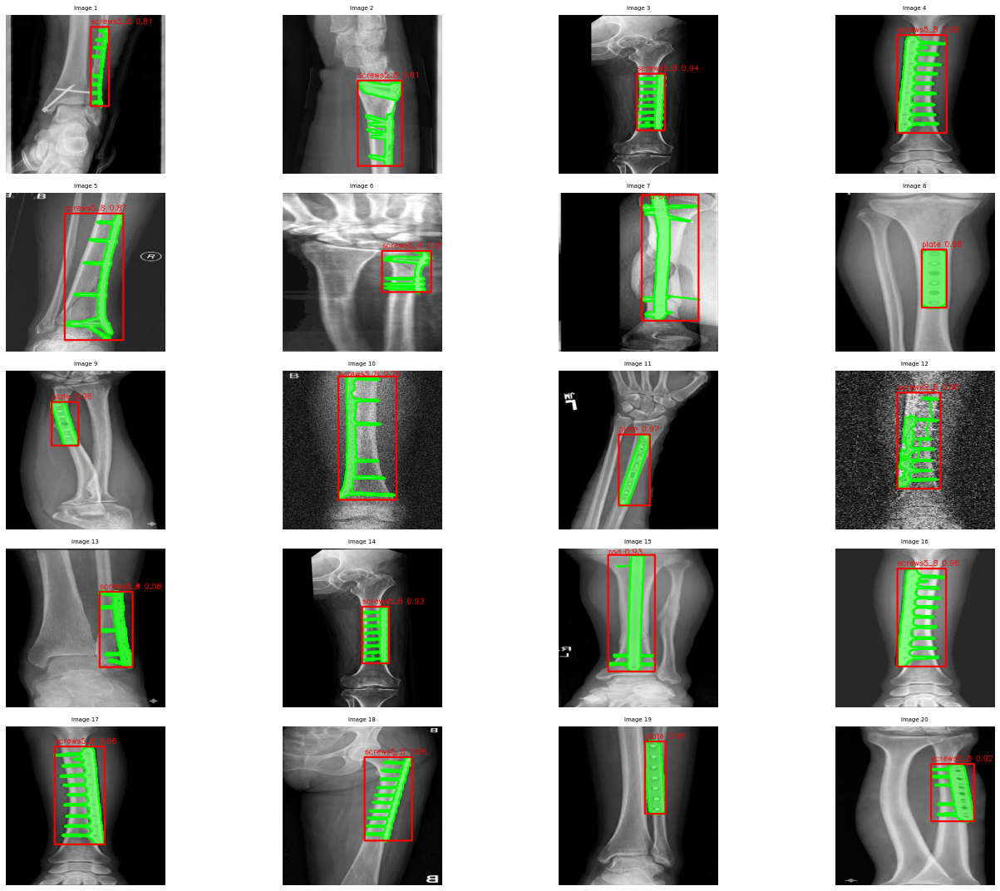

In [ ]:
import glob
import cv2
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import Image, display

test_images = glob.glob(f"{dataset.location}/test/images/*")
results = model.predict(source=test_images, conf=0.25, save=False)

cols = 4
rows = (len(results) + cols - 1) // cols
THUMB = 256

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
axes = axes.flatten()

for i, result in enumerate(results):
    img = result.orig_img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (THUMB, THUMB))
    img = np.ascontiguousarray(img)
    h, w = img.shape[:2]

    if result.masks is not None:
        for mask_xy in result.masks.xy:
            pts = (mask_xy * [w / result.orig_shape[1], h / result.orig_shape[0]]).astype(np.int32)
            overlay = img.copy()
            cv2.fillPoly(overlay, [pts], (0, 255, 0))
            img = cv2.addWeighted(img, 0.5, overlay, 0.5, 0)
            cv2.polylines(img, [pts], True, (0, 255, 0), 2)

    if result.boxes is not None:
        scale_x = w / result.orig_shape[1]
        scale_y = h / result.orig_shape[0]
        for box, conf, cls in zip(result.boxes.xyxy, result.boxes.conf, result.boxes.cls):
            x1, y1, x2, y2 = int(box[0]*scale_x), int(box[1]*scale_y), int(box[2]*scale_x), int(box[3]*scale_y)
            label = f"{result.names[int(cls)]} {conf:.2f}"
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(img, label, (x1, max(y1-5, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 0, 0), 1)

    axes[i].imshow(img)
    axes[i].axis("off")
    axes[i].set_title(f"Image {i+1}", fontsize=7)

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.savefig("test_results_seg.png", dpi=72, bbox_inches="tight")
plt.close(fig)

display(Image("test_results_seg.png"))

--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------






#**save the weights , provided here :**
https://drive.google.com/file/d/1eCQGgMZALKpWcElnUvxSCcORJ2G6jxoI/view?usp=sharing





--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import shutil

shutil.copy(
    "runs/segment/seg_run2/weights/best.pt",
    "/content/drive/MyDrive/yolo11m_seg_Implant_best.pt"
)
print("Model saved to Google Drive ")

Model saved to Google Drive 



--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------






#**Check what type of model is loadedg**

--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------
--------------------------------------------------------------------


In [ ]:
print(model.info())
print(type(model.model))

import glob
test_images = glob.glob(f"{dataset.location}/test/images/*")
result = model.predict(test_images[0], conf=0.15)[0]

print("Boxes:", result.boxes)
print("Masks:", result.masks)  # ← if this is None, model is not seg

YOLO11m-seg summary (fused): 139 layers, 22,338,396 parameters, 0 gradients, 112.9 GFLOPs
(139, 22338396, 0, 112.9073152)
<class 'ultralytics.nn.tasks.SegmentationModel'>

image 1/1 /content/binaryMasks-flux-implant-agument-2/test/images/124_png.rf.f62c4fd9585079832391aa7c64b987f8.jpg: 640x640 2 plates, 3 screws5_8s, 15.0ms
Speed: 1.8ms preprocess, 15.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
Boxes: ultralytics.engine.results.Boxes object with attributes:

cls: tensor([3., 3., 0., 3., 0.], device='cuda:0')
conf: tensor([0.8852, 0.8429, 0.7126, 0.3866, 0.1936], device='cuda:0')
data: tensor([[1.4204e+02, 5.0616e+01, 4.1666e+02, 3.6587e+02, 8.8519e-01, 3.0000e+00],
        [3.4386e+02, 5.0098e+01, 4.1940e+02, 3.6641e+02, 8.4288e-01, 3.0000e+00],
        [1.9533e+02, 4.5371e+02, 3.3269e+02, 5.6734e+02, 7.1260e-01, 0.0000e+00],
        [1.4069e+02, 5.8978e+01, 4.0553e+02, 5.7433e+02, 3.8663e-01, 3.0000e+00],
        [1.4272e+02, 6.9878e+01, 3.9076e+02, 5.6685e+02

In [ ]:
for result in results:
    print(os.path.basename(result.path), result.boxes is not None, result.masks is not None)


image0.jpg True True
image1.jpg True True
image2.jpg True True
image3.jpg True True
image4.jpg True True
image5.jpg True True
image6.jpg True True
image7.jpg True True
image8.jpg True True
image9.jpg True True
image10.jpg True True
image11.jpg True True
image12.jpg True True
image13.jpg True True
image14.jpg True True
image15.jpg True True
image16.jpg True True
image17.jpg True True
image18.jpg True True
image19.jpg True True


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/segment/train/weights/best.pt")
print(model.task)


segment


#**initail Result , not important**

In [ ]:
metrics = model.val()
print("mAP50:", metrics.seg.map50)
print("mAP50-95:", metrics.seg.map)

Ultralytics 8.4.45 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
YOLO11m-seg summary (fused): 139 layers, 22,337,625 parameters, 0 gradients, 112.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1107.7±357.4 MB/s, size: 48.1 KB)
val: Scanning /content/binaryMasks-flux-implant-agument-1/valid/labels.cache... 26 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 26/26 10.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.7it/s 0.7s
                   all         26         25      0.864      0.951      0.982      0.947      0.864      0.951      0.982      0.812
                   rod          2          2          1      0.927      0.995      0.895          1      0.927      0.995      0.645
             screws2_4          1          1      0.639          1      0.995      0.995      0.639          1      0.995      0.995
      